Cargar librerias y datos

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib as mpl

#df customers
file_path = r"resources\olist_customers_dataset.csv"
csv_customers = pd.read_csv(file_path)
df_customers = pd.DataFrame(csv_customers)
#df items
file_path = r"resources\olist_order_items_dataset.csv"
csv_items = pd.read_csv(file_path)
df_items = pd.DataFrame(csv_items)
#df payments
file_path = r"resources\olist_order_payments_dataset.csv"
csv_payments = pd.read_csv(file_path)
df_payments = pd.DataFrame(csv_payments)
#df reviews
file_path = r"resources\olist_order_reviews_dataset.csv"
csv_reviews = pd.read_csv(file_path)
df_reviews = pd.DataFrame(csv_reviews)
#df orders
file_path = r"resources\olist_orders_dataset.csv"
csv_orders = pd.read_csv(file_path)
df_orders = pd.DataFrame(csv_orders)
#df product category
file_path = r"resources\olist_product_category_name_translation.csv"
csv_product_category = pd.read_csv(file_path)
df_product_category = pd.DataFrame(csv_product_category)
#df products
file_path = r"resources\olist_products_dataset.csv"
csv_products = pd.read_csv(file_path)
df_products = pd.DataFrame(csv_products)
#df sellers
file_path = r"resources\olist_sellers_dataset.csv"
csv_sellers = pd.read_csv(file_path)
df_sellers = pd.DataFrame(csv_sellers)

Limpieza DataFrames

In [2]:
df_customers.drop_duplicates()
#crear dataset geolocation
columnas_geolocation = ['customer_zip_code_prefix', 'customer_city', 'customer_state']
df_geolocation_customers = pd.DataFrame(df_customers.loc[:, df_customers.columns.intersection(columnas_geolocation)])
#borrar columnas customer city, customer state de customers
# df_customers = df_customers.drop('customer_city', axis=1)
# df_customers = df_customers.drop('customer_state', axis=1)
#df_customers = df_customers.drop('customer_unique_id', axis=1)
df_geolocation_customers['type_user'] = 'Customer'
df_geolocation_customers.columns = ['zip_code_prefix', 'city', 'state', 'type_user']
df_geolocation_customers

,zip_code_prefix,city,state,type_user
0,14409,franca,SP,Customer
1,9790,sao bernardo do campo,SP,Customer
2,1151,sao paulo,SP,Customer
3,8775,mogi das cruzes,SP,Customer
4,13056,campinas,SP,Customer
...,...,...,...,...
99436,3937,sao paulo,SP,Customer
99437,6764,taboao da serra,SP,Customer
99438,60115,fortaleza,CE,Customer
99439,92120,canoas,RS,Customer


In [3]:
df_items.drop_duplicates()
df_items['shipping_limit_date'] = pd.to_datetime(df_items['shipping_limit_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [4]:
df_payments.drop_duplicates()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [5]:
df_reviews.drop_duplicates()
# pasar a datetime
df_reviews['review_creation_date'] = pd.to_datetime(df_reviews['review_creation_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_reviews['review_answer_timestamp'] = pd.to_datetime(df_reviews['review_creation_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
# rellenar nulos
df_reviews['review_comment_title'] = df_reviews['review_comment_title'].fillna('No title')
df_reviews['review_comment_message'] = df_reviews['review_comment_message'].fillna('No comment')
# dar formato
df_reviews['review_comment_message'] = df_reviews['review_comment_message'].str.capitalize()
df_reviews['review_comment_title'] = df_reviews['review_comment_title'].str.capitalize()
df_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,No title,No comment,2018-01-18,2018-01-18
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,No title,No comment,2018-03-10,2018-03-10
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,No title,No comment,2018-02-17,2018-02-17
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,No title,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,No title,Parabéns lojas lannister adorei comprar pela i...,2018-03-01,2018-03-01
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,No title,No comment,2018-07-07,2018-07-07
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,No title,No comment,2017-12-09,2017-12-09
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,No title,"Excelente mochila, entrega super rápida. super...",2018-03-22,2018-03-22
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,No title,No comment,2018-07-01,2018-07-01


In [6]:
df_orders.drop_duplicates()
#poner mayusculas
df_orders['order_status'] = df_orders['order_status'].str.capitalize()
#transformar fechas
df_orders['order_purchase_timestamp'] = pd.to_datetime(df_orders['order_purchase_timestamp'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_approved_at'] = pd.to_datetime(df_orders['order_approved_at'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_delivered_carrier_date'] = pd.to_datetime(df_orders['order_delivered_carrier_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_delivered_customer_date'] = pd.to_datetime(df_orders['order_delivered_customer_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_estimated_delivery_date'] = pd.to_datetime(df_orders['order_estimated_delivery_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

df_orders


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15


In [7]:
df_products.drop_duplicates()
#poner mayusculas
df_products['product_category_name'] = df_products['product_category_name'].str.capitalize()
#rellenar nulos
df_products['product_name_lenght'] = df_products['product_name_lenght'].fillna(0)
df_products['product_name_lenght'] = df_products['product_name_lenght'].astype('int64')
df_products['product_description_lenght'] = df_products['product_description_lenght'].fillna(0)
df_products['product_description_lenght'] = df_products['product_description_lenght'].astype('int64')
df_products['product_photos_qty'] = df_products['product_photos_qty'].fillna(0)
df_products['product_weight_g'] = df_products['product_weight_g'].fillna(0)
df_products['product_length_cm'] = df_products['product_length_cm'].fillna(0)
df_products['product_width_cm'] = df_products['product_width_cm'].fillna(0)

df_products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,Perfumaria,40,287,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,Artes,44,276,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,Esporte_lazer,46,250,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,Bebes,27,261,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,Utilidades_domesticas,37,402,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,Moveis_decoracao,45,67,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,Construcao_ferramentas_iluminacao,41,971,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,Cama_mesa_banho,50,799,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,Informatica_acessorios,60,156,2.0,700.0,31.0,13.0,20.0


In [8]:
df_sellers.drop_duplicates()
#crear dataset geolocation sellers
columnas_geolocation_sellers = ['seller_zip_code_prefix', 'seller_city', 'seller_state']
df_geolocation_sellers = pd.DataFrame(df_sellers.loc[:, df_sellers.columns.intersection(columnas_geolocation_sellers)])
#borrar columnas seller city, seller state de customers
# df_sellers = df_sellers.drop('seller_city', axis=1)
# df_sellers = df_sellers.drop('seller_state', axis=1)
df_geolocation_sellers['type_user'] = 'Seller'
df_geolocation_sellers.columns = ['zip_code_prefix', 'city', 'state', 'type_user']
df_geolocation_sellers

,zip_code_prefix,city,state,type_user
0,13023,campinas,SP,Seller
1,13844,mogi guacu,SP,Seller
2,20031,rio de janeiro,RJ,Seller
3,4195,sao paulo,SP,Seller
4,12914,braganca paulista,SP,Seller
...,...,...,...,...
3090,87111,sarandi,PR,Seller
3091,88137,palhoca,SC,Seller
3092,4650,sao paulo,SP,Seller
3093,96080,pelotas,RS,Seller


In [9]:
#unir datasets geolocation sellers y customers
df_geolocation = pd.merge(df_geolocation_customers, df_geolocation_sellers, on='zip_code_prefix', how='outer')
df_geolocation['city_x'] = df_geolocation['city_x'].fillna(df_geolocation['city_y'])
df_geolocation['state_x'] = df_geolocation['state_x'].fillna(df_geolocation['state_y'])
df_geolocation['type_user_x'] = df_geolocation['type_user_x'].fillna(df_geolocation['type_user_y'])
df_geolocation = df_geolocation.drop('city_y', axis=1)
df_geolocation = df_geolocation.drop('state_y', axis=1)
df_geolocation = df_geolocation.drop('type_user_y', axis=1)
df_geolocation.columns = ['zip_code_prefix', 'city', 'state', 'type_user']
df_geolocation = df_geolocation.drop_duplicates()
df_geolocation.index = range(1, len(df_geolocation) + 1)
df_geolocation


,zip_code_prefix,city,state,type_user
1,1001,sao paulo,SP,Seller
2,1003,sao paulo,SP,Customer
3,1004,sao paulo,SP,Customer
4,1005,sao paulo,SP,Customer
5,1006,sao paulo,SP,Customer
...,...,...,...,...
15115,99960,charrua,RS,Customer
15116,99965,agua santa,RS,Customer
15117,99970,ciriaco,RS,Customer
15118,99980,david canabarro,RS,Customer


In [10]:
df_products['product_category_name'] = df_products['product_category_name'].str.strip().str.capitalize()
df_product_category['product_category_name'] = df_product_category['product_category_name'].str.strip().str.capitalize()
df_products['product_category_name'] = df_products['product_category_name'].fillna('unknown')
# añadir nombre traducido
nueva_fila = {"product_category_name": "unknown", "product_category_name_english": "unknown"}
df_product_category.loc[len(df_product_category)] = nueva_fila 
df_products_merge = pd.merge(
    df_products,
    df_product_category,
    on='product_category_name',
    how='left'
)

df_products_merge

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,Perfumaria,40,287,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,Artes,44,276,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,Esporte_lazer,46,250,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,Bebes,27,261,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,Utilidades_domesticas,37,402,4.0,625.0,20.0,17.0,13.0,housewares
...,...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,Moveis_decoracao,45,67,2.0,12300.0,40.0,40.0,40.0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,Construcao_ferramentas_iluminacao,41,971,1.0,1700.0,16.0,19.0,16.0,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,Cama_mesa_banho,50,799,1.0,1400.0,27.0,7.0,27.0,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,Informatica_acessorios,60,156,2.0,700.0,31.0,13.0,20.0,computers_accessories


1. **Representa** una clasificación del nº de clientes por estado (Si consideras que hay demasiados estados representa el top 5).

 Paso siguiente crea una tabla donde se representen los estados, las ciudades que pertenecen a esos estados y el numero de clientes en esas ciudades. 
Ademas de eso, la tabla y todos los graficos representados deberan de ser dinamicos respecto a la fecha  

Contamos cuantos clientes hay por estado

In [11]:
df_customers_unique = df_customers.drop('customer_id', axis=1)
df_customers_unique = df_customers_unique.drop_duplicates(ignore_index=True)

df_state_group = df_customers_unique.groupby(['customer_state']).customer_unique_id.count().sort_values(ascending=False)
df_state_group

customer_state
SP    40405
RJ    12422
MG    11286
RS     5285
PR     4889
SC     3539
BA     3281
DF     2079
ES     1971
GO     1955
PE     1610
CE     1314
PA      950
MT      876
MA      727
MS      694
PB      519
PI      483
RN      475
AL      403
SE      343
TO      273
RO      240
AM      144
AC       77
AP       67
RR       45
Name: customer_unique_id, dtype: int64

Contamos cuantos clientes hay por ciudad

In [12]:

df_city_state_group = df_customers_unique.groupby(['customer_city','customer_state'], as_index=False).customer_unique_id.count().sort_values('customer_unique_id', ascending=False).reset_index(drop=True)

df_city_state_group= df_city_state_group.rename(columns={'customer_unique_id':'customer_number'})

df_city_state_group


,customer_city,customer_state,customer_number
0,sao paulo,SP,15013
1,rio de janeiro,RJ,6642
2,belo horizonte,MG,2681
3,brasilia,DF,2072
4,curitiba,PR,1466
...,...,...,...
4305,gramado dos loureiros,RS,1
4306,vitoria do jari,AP,1
4307,xexeu,PE,1
4308,adrianopolis,PR,1


In [13]:
df_states = df_customers.groupby('customer_state').count().sort_values('customer_id', ascending=False).reset_index()
df_states = df_states['customer_state']
df_states

0     SP
1     RJ
2     MG
3     RS
4     PR
5     SC
6     BA
7     DF
8     ES
9     GO
10    PE
11    CE
12    PA
13    MT
14    MA
15    MS
16    PB
17    PI
18    RN
19    AL
20    SE
21    TO
22    RO
23    AM
24    AC
25    AP
26    RR
Name: customer_state, dtype: object

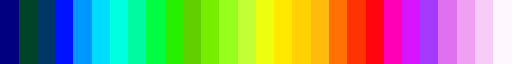

In [14]:
# asignar colores a cada estado
cmap = mpl.colormaps['gist_ncar'].resampled(28)
state_to_color = {state: cmap(i / len(df_states)) for i, state in enumerate(df_states)}
state_to_color["Other"] = cmap(28)
cmap

In [15]:
df_state_group = pd.DataFrame(df_state_group.reset_index())
top5 = df_state_group.head(5)
df_state_group_top5 = df_state_group.head(5)
others = df_state_group.iloc[5:].sum()
others['customer_unique_id']
row_others = pd.DataFrame({
    'customer_state': ['Other'],
    'customer_unique_id': [others['customer_unique_id']]
})
df_state_group_top5 = pd.concat([top5, row_others], ignore_index=True)
df_state_group_top5

,customer_state,customer_unique_id
0,SP,40405
1,RJ,12422
2,MG,11286
3,RS,5285
4,PR,4889
5,Other,22065


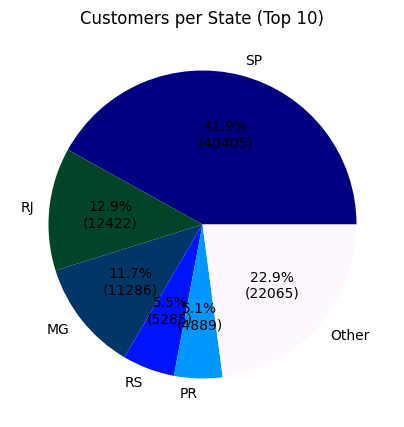

In [16]:
fig, ax = plt.subplots(figsize=(5,5))

x = df_state_group_top5['customer_state'].values
y = df_state_group_top5['customer_unique_id'].values
c = df_state_group_top5['customer_state'].head(10).apply(lambda x: state_to_color[x])


def autopct_format(values):
    def my_format(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

ax.pie(y, labels=x, autopct=autopct_format(y), colors=c)

ax.set_title('Customers per State (Top 10)')

plt.show()

In [17]:
df_city_state_group = df_customers_unique.groupby([
    'customer_city','customer_state'], as_index=False).customer_unique_id.count().sort_values('customer_unique_id', ascending=False).reset_index(drop=True)
 
df_city_state_group= df_city_state_group.rename(columns={'customer_unique_id':'customer_number'})
 
df_city_state_group

,customer_city,customer_state,customer_number
0,sao paulo,SP,15013
1,rio de janeiro,RJ,6642
2,belo horizonte,MG,2681
3,brasilia,DF,2072
4,curitiba,PR,1466
...,...,...,...
4305,gramado dos loureiros,RS,1
4306,vitoria do jari,AP,1
4307,xexeu,PE,1
4308,adrianopolis,PR,1


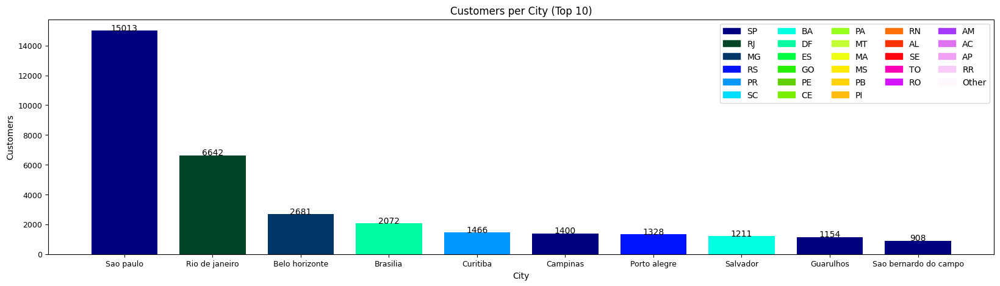

In [18]:
fig, ax = plt.subplots(figsize=(20,5))

# df_state_group.info()

x = df_city_state_group['customer_city'].head(10).str.capitalize().values
y = df_city_state_group['customer_number'].head(10).values
c = df_city_state_group['customer_state'].head(10).apply(lambda x: state_to_color[x])

labels = (state_to_color.keys())
handles = [plt.Rectangle((0,0),1,1, color=state_to_color[label]) for label in labels]
ax.legend(handles, labels, ncols = 5)

ax.bar(x,y, color=c, width = 0.75)

# Poner nota encima de la barra
for i in range(len(x)):
    ax.text(i, y[i], y[i], ha='center')

ax.tick_params(labelsize=9)
ax.set_ylabel('Customers')
ax.set_xlabel('City')
ax.set_title('Customers per City (Top 10)')


plt.show()

2. **Añade** a la tabla anterior dos columnas (nº pedidos y el porcentaje respecto al total de pedidos), y el ratio del numero de pedido medio por cliente, representa la información en el grafico que consideres oportuno ¿Que te transmite esta informacion? ¿Que acciones como analista de datos crees que deberia de tomar la empresa para mejorar sus ventas? 

Ventas por Estado

In [19]:
df_customers.groupby(['customer_state']).customer_id.count().sort_values(ascending=False)


customer_state
SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: customer_id, dtype: int64

Pedidos por ciudad

In [20]:
df_city_state_group_orders = df_customers.groupby(['customer_city','customer_state'], as_index=False).customer_id.count().sort_values('customer_id', ascending=False).reset_index(drop=True)

df_city_state_group_orders= df_city_state_group_orders.rename(columns={'customer_id':'order_numbers'})
df_city_state_group_orders['order_numbers']


0       15540
1        6882
2        2773
3        2131
4        1521
        ...  
4305        1
4306        1
4307        1
4308        1
4309        1
Name: order_numbers, Length: 4310, dtype: int64

In [21]:
#columna numero pedidos
df_city_customer_orders = df_city_state_group
df_city_customer_orders['order_number'] = df_city_state_group_orders['order_numbers']
df_city_customer_orders

,customer_city,customer_state,customer_number,order_number
0,sao paulo,SP,15013,15540
1,rio de janeiro,RJ,6642,6882
2,belo horizonte,MG,2681,2773
3,brasilia,DF,2072,2131
4,curitiba,PR,1466,1521
...,...,...,...,...
4305,gramado dos loureiros,RS,1,1
4306,vitoria do jari,AP,1,1
4307,xexeu,PE,1,1
4308,adrianopolis,PR,1,1


In [22]:
#columna porcetaje pedidos
sum_orders = df_city_customer_orders['order_number'].sum()
df_city_customer_orders['order_percentage_%'] = ((df_city_customer_orders['order_number']/sum_orders)*100).round(2)
df_city_customer_orders

,customer_city,customer_state,customer_number,order_number,order_percentage_%
0,sao paulo,SP,15013,15540,15.63
1,rio de janeiro,RJ,6642,6882,6.92
2,belo horizonte,MG,2681,2773,2.79
3,brasilia,DF,2072,2131,2.14
4,curitiba,PR,1466,1521,1.53
...,...,...,...,...,...
4305,gramado dos loureiros,RS,1,1,0.00
4306,vitoria do jari,AP,1,1,0.00
4307,xexeu,PE,1,1,0.00
4308,adrianopolis,PR,1,1,0.00


In [23]:
#columnma ratio pedidos por clientes
df_city_customer_orders['ratio_customer_order'] = (df_city_customer_orders['order_number']/df_city_customer_orders['customer_number']).round(2)
df_city_customer_orders

,customer_city,customer_state,customer_number,order_number,order_percentage_%,ratio_customer_order
0,sao paulo,SP,15013,15540,15.63,1.04
1,rio de janeiro,RJ,6642,6882,6.92,1.04
2,belo horizonte,MG,2681,2773,2.79,1.03
3,brasilia,DF,2072,2131,2.14,1.03
4,curitiba,PR,1466,1521,1.53,1.04
...,...,...,...,...,...,...
4305,gramado dos loureiros,RS,1,1,0.00,1.00
4306,vitoria do jari,AP,1,1,0.00,1.00
4307,xexeu,PE,1,1,0.00,1.00
4308,adrianopolis,PR,1,1,0.00,1.00


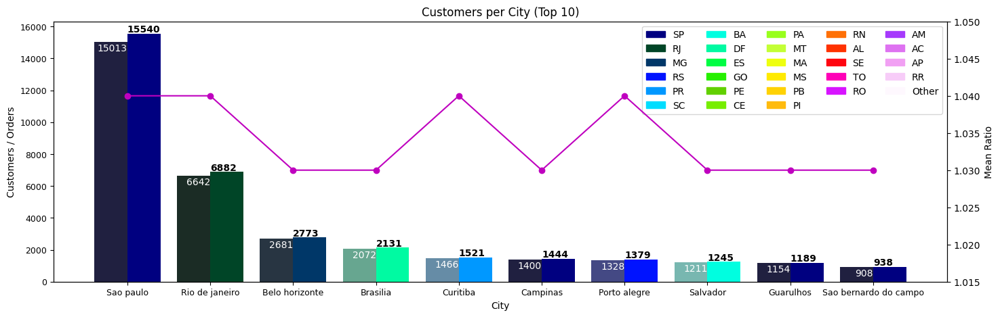

In [24]:
fig, ax1 = plt.subplots(figsize=(17,5))
ax2 = ax1.twinx()

# Asiganr datos a los ejes
x = df_city_customer_orders['customer_city'].head(10).str.capitalize().values
y1 = df_city_customer_orders['customer_number'].head(10).values
y2 = df_city_customer_orders['order_number'].head(10).values
y3 = df_city_customer_orders['ratio_customer_order'].head(10).values
c = df_city_customer_orders['customer_state'].head(10).apply(lambda x: state_to_color[x])

labels = (state_to_color.keys())
handles = [plt.Rectangle((0,0),1,1, color=state_to_color[label]) for label in labels]
ax1.legend(handles, labels, ncols=5)

def desaturate(color, factor=0.25):  # 0 = gris, 1 = original
    rgb = mcolors.to_rgb(color)
    gray = sum(rgb)/3
    return tuple(gray + factor * (c - gray) for c in rgb)
colors_pastel = {k: desaturate(v) for k, v in state_to_color.items()}
c = df_city_state_group['customer_state'].head(10).apply(lambda x: state_to_color[x])
c_pastel = df_city_state_group['customer_state'].head(10).apply(lambda x: colors_pastel[x])

# Graficar datos
w, pos = 0.4, np.arange(len(x))
ax1.bar(pos - w/2, y1, width=w, color = c_pastel)
ax1.bar(pos + w/2, y2, width=w, color = c)
ax2.plot(x, y3, marker='o', color='m')

# Poner nota encima de la barra
for i in range(len(x)):
    ax1.text(i, y1[i]-100, y1[i], ha='right', va='top', color='white')
    ax1.text(i, y2[i]+100, y2[i], ha='left', weight='bold')

# dar formato
ax1.set_xticks(pos, x)
ax1.tick_params(labelsize=9)
ax1.set_ylabel('Customers / Orders')
ax1.set_xlabel('City')
ax1.set_title('Customers per City (Top 10)')
ax2.set_ylabel('Mean Ratio')
ax2.set_ylim(1.015, 1.05)

plt.show()

**Calcula**, el nº de pedidos que llegan tarde por ciudad, el porcentaje que representa respecto al total de pedidos por ciudad, 
junto con el tiempo medio de dias que se pasan de fecha, queremos que a la hora de representar esta falla salga ya autodiagnosticada 
con la razon mas probable del problema. (Analiza el dataset)

In [25]:
df_orders.drop_duplicates()
#poner mayusculas
df_orders['order_status'] = df_orders['order_status'].str.capitalize()
#transformar fechas
df_orders['order_purchase_timestamp'] = pd.to_datetime(df_orders['order_purchase_timestamp'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_approved_at'] = pd.to_datetime(df_orders['order_approved_at'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_delivered_carrier_date'] = pd.to_datetime(df_orders['order_delivered_carrier_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_delivered_customer_date'] = pd.to_datetime(df_orders['order_delivered_customer_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders['order_estimated_delivery_date'] = pd.to_datetime(df_orders['order_estimated_delivery_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15


Calculamos los pedidos que han llegado tarde

In [26]:
# Calcular el tiempo que pasa desde que se ha estimado la entrega hasta que ha sido entregado
df_orders['date_diference'] = df_orders['order_estimated_delivery_date'] - df_orders['order_delivered_customer_date']
# si el resultado es negativo, el pedido llego tarde
negative_dates_df = df_orders[df_orders['date_diference'] < pd.Timedelta(0)]
negative_dates_df


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_diference
20,203096f03d82e0dffbc41ebc2e2bcfb7,d2b091571da224a1b36412c18bc3bbfe,Delivered,2017-09-18 14:31:30,2017-09-19 04:04:09,2017-10-06 17:50:03,2017-10-09 22:23:46,2017-09-28,-12 days +01:36:14
25,fbf9ac61453ac646ce8ad9783d7d0af6,3a874b4d4c4b6543206ff5d89287f0c3,Delivered,2018-02-20 23:46:53,2018-02-22 02:30:46,2018-02-26 22:25:22,2018-03-21 22:03:54,2018-03-12,-10 days +01:56:06
35,8563039e855156e48fccee4d611a3196,5f16605299d698660e0606f7eae2d2f9,Delivered,2018-02-17 15:59:46,2018-02-17 16:15:34,2018-02-20 23:03:56,2018-03-20 00:59:25,2018-03-20,-1 days +23:00:35
41,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,Delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21,-8 days +05:00:37
57,66e4624ae69e7dc89bd50222b59f581f,684fa6da5134b9e4dab731e00011712d,Delivered,2018-03-09 14:50:15,2018-03-09 15:40:39,2018-03-15 00:31:19,2018-04-03 13:28:46,2018-04-02,-2 days +10:31:14
...,...,...,...,...,...,...,...,...,...
99396,b3112ca67f3afd4e20cf2ee91fc4f804,6f83c71b6c044fb156d697d4130fe9b5,Delivered,2018-08-02 22:46:54,2018-08-02 23:04:06,2018-08-15 17:42:00,2018-08-21 00:03:26,2018-08-16,-6 days +23:56:34
99397,0fa1fab1d7c1211c824596ed5e111e3c,7f3bd6c94d2daf7b6462d1a894a775b4,Delivered,2018-03-13 21:48:57,2018-03-13 22:40:28,2018-03-14 19:27:23,2018-04-05 19:59:49,2018-04-02,-4 days +04:00:11
99423,38e9133ce29f6bbe35aed9c3863dce01,ad312389a098ceff46ce92c4595c06d0,Delivered,2017-10-12 20:54:11,2017-10-14 03:28:24,2017-10-17 17:04:42,2017-11-21 17:06:59,2017-10-31,-22 days +06:53:01
99425,d692ef54145c9cb3322ec2e5508aa3f4,82ddfcf9438b0cd1117b55ac33184df8,Delivered,2018-03-21 19:47:18,2018-03-21 20:05:26,2018-03-22 21:11:58,2018-04-11 00:48:31,2018-04-09,-3 days +23:11:29


In [27]:
# juntamos la tabla de pedidos retrasados con la de clientes
df_merge_negative_dates_customers = pd.merge(
    df_customers,
    negative_dates_df,
    on='customer_id',
    how='inner'
)
df_merge_negative_dates_customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_diference
0,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,Delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,-2 days +06:01:09
1,9b8ce803689b3562defaad4613ef426f,7f3a72e8f988c6e735ba118d54f47458,5416,sao paulo,SP,17825f24877a9289214c301ae0c9424b,Delivered,2017-05-11 13:48:47,2017-05-13 11:55:16,2017-05-15 15:30:02,2017-06-07 12:02:14,2017-05-30,-9 days +11:57:46
2,b2bed119388167a954382cca36c4777f,e079b18794454de9d2be5c12b4392294,27525,resende,RJ,77b062be7c5bd21712905feb8e1cfeed,Delivered,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-06-22 08:11:38,2017-07-07 20:32:47,2017-07-07,-1 days +03:27:13
3,a905baa530258422594f1b05615bd225,c80da60feddb7cf8325bd104032e314a,60140,fortaleza,CE,4f0695330f3816ef294bf1f4b18f4f2e,Delivered,2018-03-29 21:28:04,2018-03-29 21:35:20,2018-04-12 23:36:29,2018-05-08 16:52:07,2018-04-23,-16 days +07:07:53
4,6bed27564bd99d78d09c1fac13da56fd,463093247faa080167d77f2e6d1b297d,13321,salto,SP,0e5d9583490deb1e011b1c8e7da13398,Delivered,2018-03-22 12:07:30,2018-03-22 12:15:45,2018-03-27 22:12:24,2018-05-09 19:48:38,2018-04-11,-29 days +04:11:22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7822,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,Delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,2018-02-20 17:48:37,2018-02-19,-2 days +06:11:23
7823,b7c889215de76857c7967c1011125d2d,522e244a96d13876c5bac4985a8d5075,82410,curitiba,PR,1a9543c90f188e2e4fb14327ad4a9c9b,Delivered,2018-01-30 15:28:21,2018-01-31 15:30:30,2018-02-16 16:28:33,2018-03-16 20:03:53,2018-03-13,-4 days +03:56:07
7824,0a7db3996b88954c7aa763b5dd621d5b,15637b62dfa4c5a9df846b22beef0994,52090,recife,PE,d8b354d53fff40dcc80a7e64dbfc2878,Delivered,2018-02-13 18:20:51,2018-02-13 18:30:31,2018-02-14 20:22:56,2018-03-29 20:26:42,2018-03-15,-15 days +03:33:18
7825,1ed0c832c2dd99570a59260e71768bdf,82d46759af0369aad49084bacf85a6c3,37610,bom repouso,MG,51c6d2f460589fa7b65f2da51e860206,Delivered,2017-11-14 12:04:09,2017-11-14 12:15:25,2017-11-27 20:44:47,2017-12-19 19:37:33,2017-12-12,-8 days +04:22:27


In [28]:
#pedidos tarde por ciudad
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('customer_unique_id', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_id', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_status', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_purchase_timestamp', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_approved_at', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_delivered_carrier_date', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_delivered_customer_date', axis=1)
df_merge_negative_dates_customers = df_merge_negative_dates_customers.drop('order_estimated_delivery_date', axis=1)

df_city_state_late_group = df_merge_negative_dates_customers.groupby(['customer_city','customer_state'], as_index=False).customer_id.count().sort_values('customer_id', ascending=False).reset_index(drop=True)

df_city_state_late_group= df_city_state_late_group.rename(columns={'customer_id':'orders_late'})

df_city_state_late_group

,customer_city,customer_state,orders_late
0,sao paulo,SP,942
1,rio de janeiro,RJ,780
2,salvador,BA,208
3,belo horizonte,MG,166
4,porto alegre,RS,158
...,...,...,...
1314,ampere,PR,1
1315,vila pereira,MG,1
1316,vila nova do sul,RS,1
1317,alcobaca,BA,1


In [29]:
#el porcentaje que representa respecto al total de pedidos por ciudad
df_city_state_late_group['late_orders_respect_total_%'] = ((df_city_state_late_group['orders_late']/df_city_customer_orders['order_number'])*100).round(2)
df_city_state_late_group

,customer_city,customer_state,orders_late,late_orders_respect_total_%
0,sao paulo,SP,942,6.06
1,rio de janeiro,RJ,780,11.33
2,salvador,BA,208,7.50
3,belo horizonte,MG,166,7.79
4,porto alegre,RS,158,10.39
...,...,...,...,...
1314,ampere,PR,1,16.67
1315,vila pereira,MG,1,16.67
1316,vila nova do sul,RS,1,16.67
1317,alcobaca,BA,1,16.67


In [30]:
#junto con el tiempo medio de dias que se pasan de fecha
df_merge_negative_dates_customers['date_diference'] = df_merge_negative_dates_customers['date_diference'].abs()
df_city_state_late_mean_days_group = df_merge_negative_dates_customers.groupby(['customer_city','customer_state'], as_index=False)['date_diference'].mean().sort_values('date_diference', ascending=False).reset_index(drop=True)
df_city_state_late_mean_days_group = df_city_state_late_mean_days_group.rename(columns={'date_diference':'days_diference_mean'})
df_city_state_late_mean_days_group

,customer_city,customer_state,days_diference_mean
0,montanha,ES,181 days 14:36:39
1,perdizes,MG,162 days 17:14:25
2,macapa,AP,144 days 16:28:58
3,novo brasil,ES,126 days 16:41:56
4,quintana,SP,121 days 20:47:58
...,...,...,...
1314,sao jose do belmonte,PE,0 days 01:32:07
1315,alvorada,TO,0 days 00:59:25
1316,itapaci,GO,0 days 00:22:38
1317,piedade do rio grande,MG,0 days 00:08:58


In [31]:
# agrupamos todas las metricas de pedidos que han llegado tarde
df_merge_late_total = pd.merge(
    df_city_state_late_group,
    df_city_state_late_mean_days_group,
    on='customer_city',
    how='inner'
)

df_merge_late_total = df_merge_late_total.drop('customer_state_y', axis=1)
df_merge_late_total= df_merge_late_total.rename(columns={'customer_state_x':'customer_state'})
df_merge_late_total

,customer_city,customer_state,orders_late,late_orders_respect_total_%,days_diference_mean
0,sao paulo,SP,942,6.06,6 days 09:28:35.647558386
1,rio de janeiro,RJ,780,11.33,12 days 18:35:43.294871794
2,salvador,BA,208,7.50,9 days 18:13:16.269230769
3,belo horizonte,MG,166,7.79,6 days 19:16:06.216867469
4,porto alegre,RS,158,10.39,9 days 19:06:22.715189873
...,...,...,...,...,...
1354,ampere,PR,1,16.67,0 days 16:37:00
1355,vila pereira,MG,1,16.67,1 days 13:52:27
1356,vila nova do sul,RS,1,16.67,0 days 09:36:50
1357,alcobaca,BA,1,16.67,2 days 06:32:10


In [32]:
# pasamos los dias de datetime a float para poder hacer calculos
df_merge_late_total['days_diff_float'] = df_merge_late_total['days_diference_mean'].dt.total_seconds() / 86400
df_merge_late_total['days_diff_float']


0        6.394857
1       12.774807
2        9.759216
3        6.802850
4        9.796096
          ...    
1354     0.692361
1355     1.578090
1356     0.400579
1357     2.272338
1358     5.240278
Name: days_diff_float, Length: 1359, dtype: float64

In [33]:
# clasificamos los retrasos
def diagnose(row):
    delay = row['days_diff_float']                     
    pct = row['late_orders_respect_total_%']          
    late = row['orders_late']                          

    #Reglas de diagnóstico

    if delay > 10:
        return "Retrasos severos: rutas largas o problemas logísticos regionales"

    if pct > 30:
        return "Alta proporción de retrasos: sobrecarga operativa o falta de infraestructura"

    if late > 5 and pct < 20:
        return "Pocos pedidos tardíos pero desviaciones grandes: fallos puntuales de transportista"

    if delay <= 3:
        return "Retraso leve: problemas típicos de última hora o reparto urbano"

    return "Retraso moderado: problemas recurrentes pero no críticos"

In [34]:
df_merge_late_total['diagnosis'] = df_merge_late_total.apply(diagnose, axis=1)
df_merge_late_total = df_merge_late_total.drop('days_diff_float', axis=1)
df_merge_late_total

,customer_city,customer_state,orders_late,late_orders_respect_total_%,days_diference_mean,diagnosis
0,sao paulo,SP,942,6.06,6 days 09:28:35.647558386,Pocos pedidos tardíos pero desviaciones grande...
1,rio de janeiro,RJ,780,11.33,12 days 18:35:43.294871794,Retrasos severos: rutas largas o problemas log...
2,salvador,BA,208,7.50,9 days 18:13:16.269230769,Pocos pedidos tardíos pero desviaciones grande...
3,belo horizonte,MG,166,7.79,6 days 19:16:06.216867469,Pocos pedidos tardíos pero desviaciones grande...
4,porto alegre,RS,158,10.39,9 days 19:06:22.715189873,Pocos pedidos tardíos pero desviaciones grande...
...,...,...,...,...,...,...
1354,ampere,PR,1,16.67,0 days 16:37:00,Retraso leve: problemas típicos de última hora...
1355,vila pereira,MG,1,16.67,1 days 13:52:27,Retraso leve: problemas típicos de última hora...
1356,vila nova do sul,RS,1,16.67,0 days 09:36:50,Retraso leve: problemas típicos de última hora...
1357,alcobaca,BA,1,16.67,2 days 06:32:10,Retraso leve: problemas típicos de última hora...


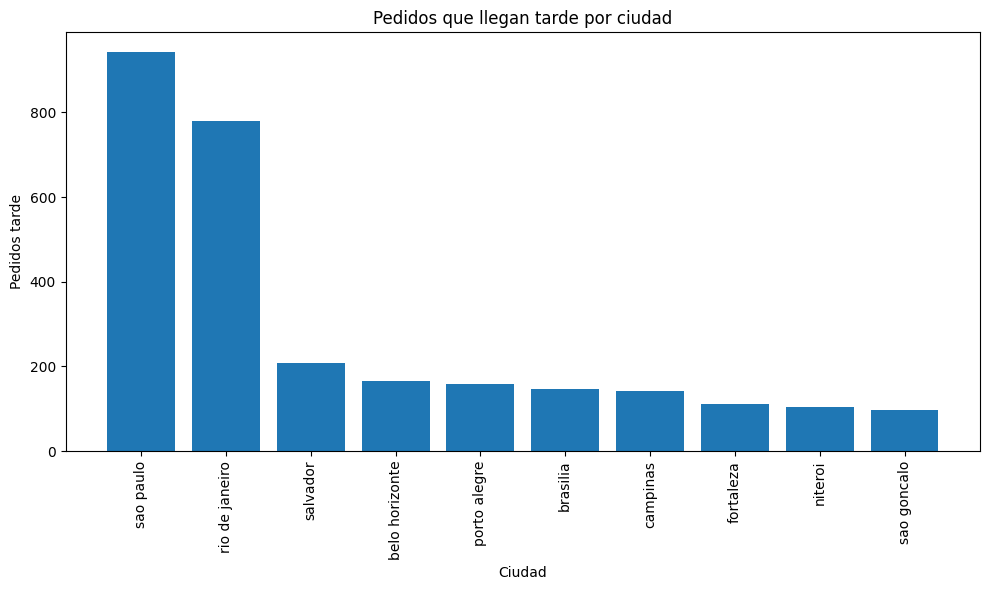

In [35]:
#graficos
#ciudades con mas pedidos tarde
df_sorted = df_merge_late_total.sort_values('orders_late', ascending=False).head(10)

plt.figure(figsize=(10,6))
plt.bar(df_sorted['customer_city'], df_sorted['orders_late'])
plt.xticks(rotation=90)
plt.title("Pedidos que llegan tarde por ciudad")
plt.ylabel("Pedidos tarde")
plt.xlabel("Ciudad")
plt.tight_layout()
plt.show()

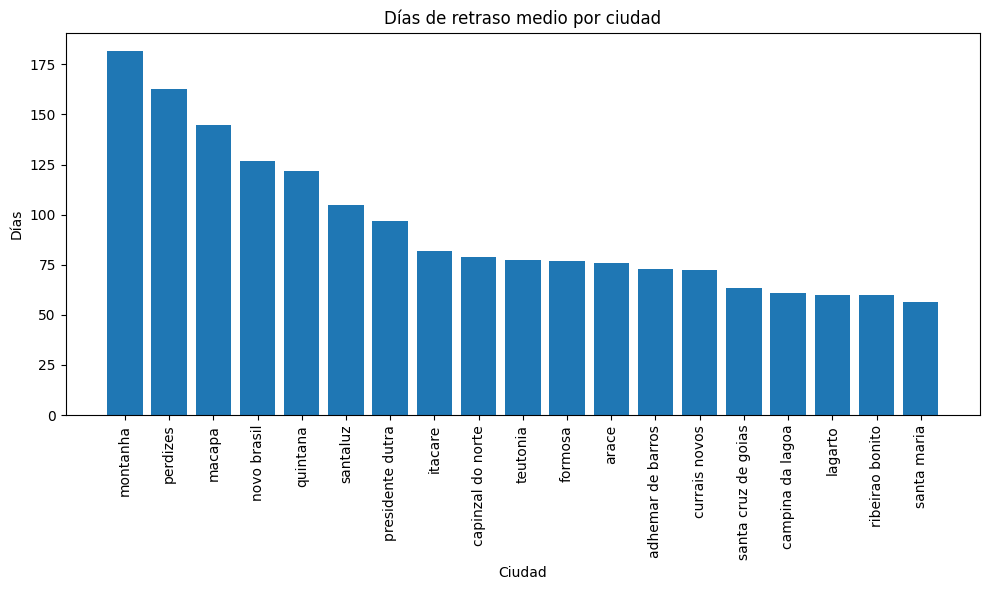

In [36]:
#dias retraso medio
df_merge_late_total['delay_days'] = df_merge_late_total['days_diference_mean'].dt.total_seconds() / 86400
df_sorted = df_merge_late_total.sort_values('delay_days', ascending=False).head(20)

plt.figure(figsize=(10,6))
plt.bar(df_sorted['customer_city'], df_sorted['delay_days'])
plt.xticks(rotation=90)
plt.title("Días de retraso medio por ciudad")
plt.ylabel("Días")
plt.xlabel("Ciudad")
plt.tight_layout()
plt.show()

C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\2510506789.py:7: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


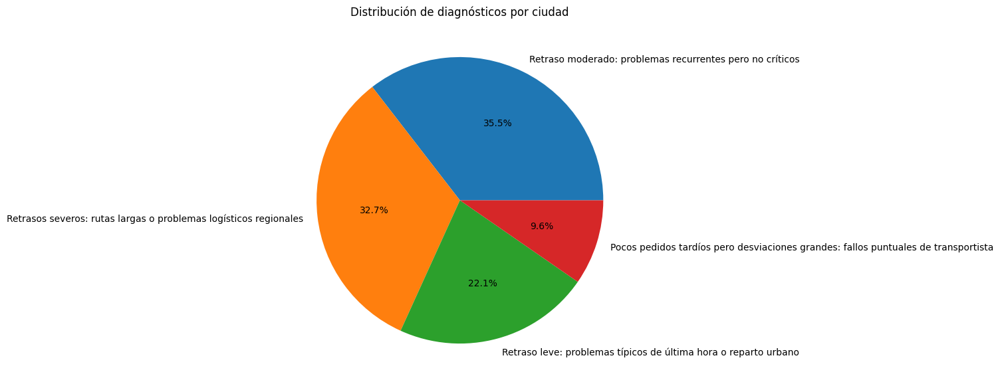

In [37]:
#diagnostico
diagnosis_counts = df_merge_late_total['diagnosis'].value_counts()

plt.figure(figsize=(7,7))
plt.pie(diagnosis_counts, labels=diagnosis_counts.index, autopct='%1.1f%%')
plt.title("Distribución de diagnósticos por ciudad")
plt.tight_layout()
plt.show()

4. Calcula y representa el numero de reviews por estado y el score medio en cada una de ellas, como ya hemos tenido en cuenta los pedidos con retraso en la seccion anterior vamos a eliminar estos datos del apartado de score ya que se entiende que la opinion será negativa por la tardanza de llegada del producto

In [38]:
df_reviews.drop_duplicates()
df_reviews['review_creation_date'] = pd.to_datetime(df_reviews['review_creation_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_reviews['review_answer_timestamp'] = pd.to_datetime(df_reviews['review_creation_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
df_reviews['review_comment_title'] = df_reviews['review_comment_title'].fillna('No title')
df_reviews['review_comment_message'] = df_reviews['review_comment_message'].fillna('No comment')
df_reviews['review_comment_message'] = df_reviews['review_comment_message'].str.capitalize()
df_reviews['review_comment_title'] = df_reviews['review_comment_title'].str.capitalize()
df_reviews_view = df_reviews[['order_id','review_id','review_score']]
# df_reviews_view =df_reviews_view.drop_duplicates('order_id')

df_reviews_view


,order_id,review_id,review_score
0,73fc7af87114b39712e6da79b0a377eb,7bc2406110b926393aa56f80a40eba40,4
1,a548910a1c6147796b98fdf73dbeba33,80e641a11e56f04c1ad469d5645fdfde,5
2,f9e4b658b201a9f2ecdecbb34bed034b,228ce5500dc1d8e020d8d1322874b6f0,5
3,658677c97b385a9be170737859d3511b,e64fb393e7b32834bb789ff8bb30750e,5
4,8e6bfb81e283fa7e4f11123a3fb894f1,f7c4243c7fe1938f181bec41a392bdeb,5
...,...,...,...
99219,2a8c23fee101d4d5662fa670396eb8da,574ed12dd733e5fa530cfd4bbf39d7c9,5
99220,22ec9f0669f784db00fa86d035cf8602,f3897127253a9592a73be9bdfdf4ed7a,5
99221,55d4004744368f5571d1f590031933e4,b3de70c89b1510c4cd3d0649fd302472,5
99222,7725825d039fc1f0ceb7635e3f7d9206,1adeb9d84d72fe4e337617733eb85149,4


In [39]:
#pedidos entregados a tiempo
df_orders['date_diference'] = df_orders['order_estimated_delivery_date'] - df_orders['order_delivered_customer_date']
positive_dates_df = df_orders[df_orders['date_diference'] > pd.Timedelta(0)]
positive_dates_df 



,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_diference
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7 days 02:34:47
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,5 days 08:32:15
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,17 days 05:53:31
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,12 days 23:31:18
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,9 days 05:42:58
...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,10 days 08:51:59
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1 days 06:22:04
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,5 days 12:35:43
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,20 days 00:27:06


In [40]:
df_merge_positive_dates_customers = pd.merge(
    positive_dates_df,
    df_reviews_view,
    on='order_id',
    how='inner'
)
df_merge_positive_dates_customers

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_diference,review_id,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7 days 02:34:47,a54f0611adc9ed256b57ede6b6eb5114,4
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,5 days 08:32:15,8d5266042046a06655c8db133d120ba5,4
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,17 days 05:53:31,e73b67b67587f7644d5bd1a52deb1b01,5
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,12 days 23:31:18,359d03e676b3c069f62cadba8dd3f6e8,5
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,9 days 05:42:58,e50934924e227544ba8246aeb3770dd4,5
...,...,...,...,...,...,...,...,...,...,...,...
88653,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,10 days 08:51:59,e262b3f92d1ce917aa412a9406cf61a6,5
88654,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1 days 06:22:04,29bb71b2760d0f876dfa178a76bc4734,4
88655,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,5 days 12:35:43,371579771219f6db2d830d50805977bb,5
88656,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,20 days 00:27:06,8ab6855b9fe9b812cd03a480a25058a1,2


In [41]:
df_merge_positive_dates_customers = df_merge_positive_dates_customers[['customer_id', 'review_score']]
df_merge_positive_dates_customers

,customer_id,review_score
0,9ef432eb6251297304e76186b10a928d,4
1,b0830fb4747a6c6d20dea0b8c802d7ef,4
2,41ce2a54c0b03bf3443c3d931a367089,5
3,f88197465ea7920adcdbec7375364d82,5
4,8ab97904e6daea8866dbdbc4fb7aad2c,5
...,...,...
88653,39bd1228ee8140590ac3aca26f2dfe00,5
88654,1fca14ff2861355f6e5f14306ff977a7,4
88655,1aa71eb042121263aafbe80c1b562c9c,5
88656,b331b74b18dc79bcdf6532d51e1637c1,2


In [42]:
# asignar a cada pedido la nota que ha recibido
df_merge_reviews_customers = pd.merge(
    df_customers,
    df_merge_positive_dates_customers,
    on='customer_id',
    how='inner'
)
df_merge_reviews_customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,review_score
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,4
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,5
2,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,5
3,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,5
4,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC,5
...,...,...,...,...,...,...
88653,7fe2e80252a9ea476f950ae8f85b0f8f,4b5820135d360a45552b5163835b1d89,35500,divinopolis,MG,1
88654,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,4
88655,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,5
88656,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,5


In [43]:
# reviews por estado
df_merge_number_reviews_customers= df_merge_reviews_customers.groupby(['customer_state'])['review_score'].count().sort_values(ascending=False).reset_index(name='number_reviews')

df_merge_number_reviews_customers

,customer_state,number_reviews
0,SP,38123
1,MG,10729
2,RJ,10651
3,RS,4981
4,PR,4676
5,SC,3193
6,BA,2799
7,DF,1940
8,GO,1806
9,ES,1743


In [44]:
#score medio
df_mean_score = df_merge_reviews_customers.groupby('customer_state')['review_score'].mean().sort_values(ascending=False).round(2).reset_index(name='review_score_mean')
df_mean_score

,customer_state,review_score_mean
0,RN,4.40
1,MS,4.37
2,SP,4.33
3,RS,4.31
4,AL,4.31
5,PR,4.31
6,PE,4.30
7,TO,4.29
8,SC,4.29
9,PI,4.29


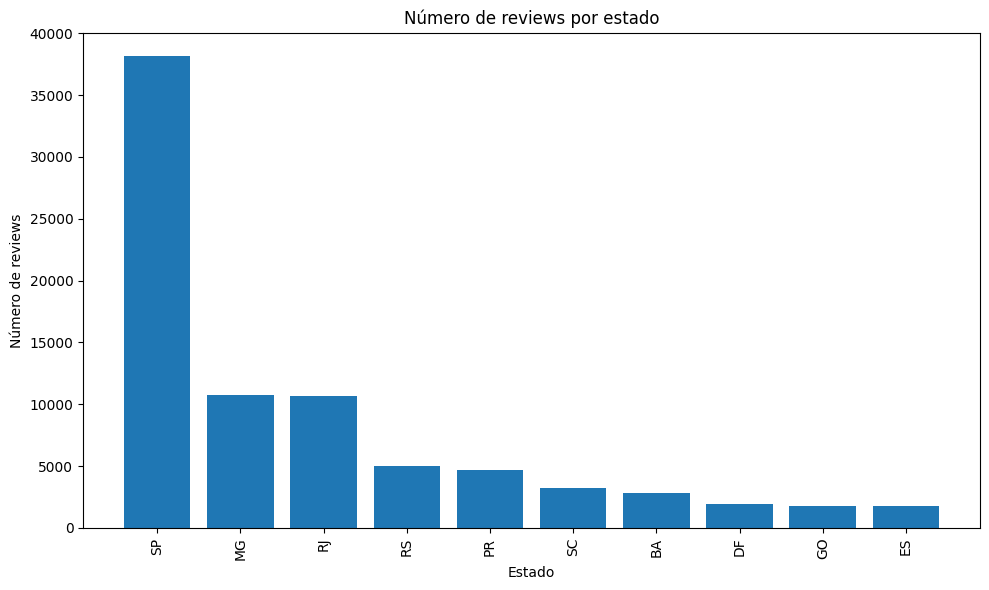

In [45]:
#graficos
#Nº de reviews por estado
df_sorted = df_merge_number_reviews_customers.sort_values('number_reviews', ascending=False).head(10)

plt.figure(figsize=(10,6))
plt.bar(df_sorted['customer_state'], df_sorted['number_reviews'])
plt.xticks(rotation=90)
plt.title("Número de reviews por estado")
plt.ylabel("Número de reviews")
plt.xlabel("Estado")
plt.tight_layout()
plt.show()

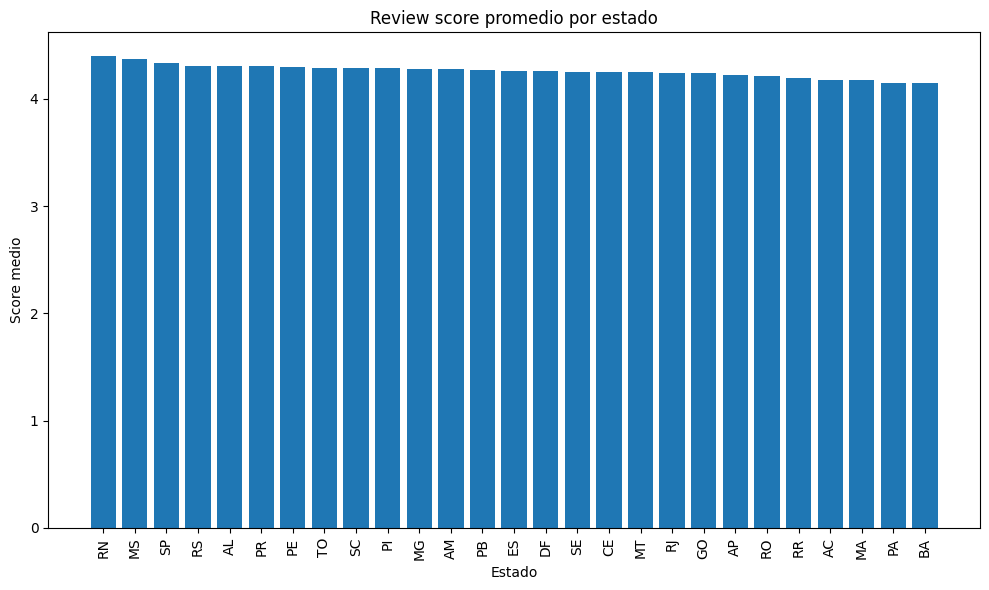

In [46]:
#review score medio por estado
df_sorted = df_mean_score.sort_values('review_score_mean', ascending=False)

plt.figure(figsize=(10,6))
plt.bar(df_sorted['customer_state'], df_sorted['review_score_mean'])
plt.xticks(rotation=90)
plt.title("Review score promedio por estado")
plt.ylabel("Score medio")
plt.xlabel("Estado")
plt.tight_layout()
plt.show()

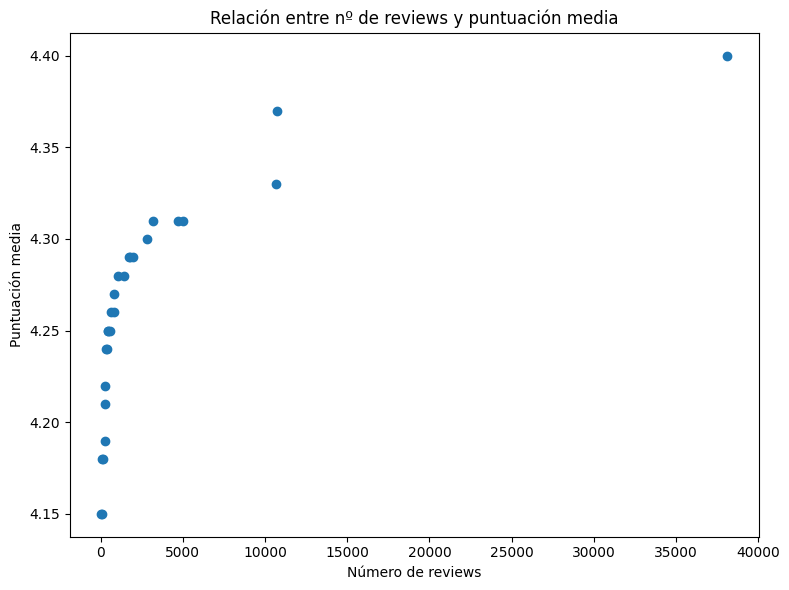

In [47]:
#Relación reviews vs score
plt.figure(figsize=(8,6))
plt.scatter(df_merge_number_reviews_customers['number_reviews'], df_mean_score['review_score_mean'])
plt.title("Relación entre nº de reviews y puntuación media")
plt.xlabel("Número de reviews")
plt.ylabel("Puntuación media")
plt.tight_layout()
plt.show()

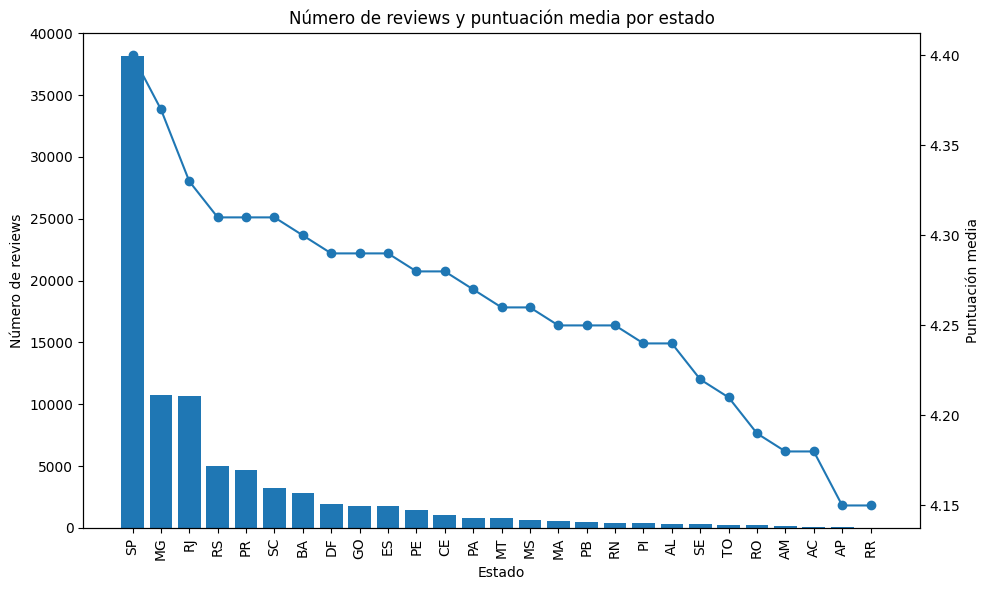

In [48]:
df_sorted = df_merge_number_reviews_customers.sort_values('number_reviews', ascending=False)
df_sorted2 = df_mean_score.sort_values('review_score_mean', ascending=False)

fig, ax1 = plt.subplots(figsize=(10,6))

# Barras
ax1.bar(df_sorted['customer_state'], df_sorted['number_reviews'])
ax1.set_xlabel("Estado")
ax1.set_ylabel("Número de reviews")
ax1.tick_params(axis='x', rotation=90)

# Línea en segundo eje
ax2 = ax1.twinx()
ax2.plot(df_sorted['customer_state'], df_sorted2['review_score_mean'], marker='o')
ax2.set_ylabel("Puntuación media")

plt.title("Número de reviews y puntuación media por estado")
plt.tight_layout()
plt.show()

In [49]:
#Sacar numero de productos vendidos por su categoría. Agrupado por estado y país. Utilizar pedidos vendidos y entregados.
df_merge_product_categories_items = pd.merge(
    df_items,
    df_products_merge,
    on='product_id',
    how='inner'
)
df_merge_product_categories_items = df_merge_product_categories_items[['order_id','product_id','product_category_name_english']]
df_merge_product_categories_items

,order_id,product_id,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,e5f2d52b802189ee658865ca93d83a8f,pet_shop
2,000229ec398224ef6ca0657da4fc703e,c777355d18b72b67abbeef9df44fd0fd,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,7634da152a4610f1595efa32f14722fc,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,ac6c3623068f30de03045865e4e10089,garden_tools
...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,4aa6014eceb682077f9dc4bffebc05b0,housewares
112646,fffcd46ef2263f404302a634eb57f7eb,32e07fd915822b0765e448c4dd74c828,computers_accessories
112647,fffce4705a9662cd70adb13d4a31832d,72a30483855e2eafc67aee5dc2560482,sports_leisure
112648,fffe18544ffabc95dfada21779c9644f,9c422a519119dcad7575db5af1ba540e,computers_accessories


In [50]:
df_orders_order_customer_status = df_orders[['order_id','customer_id','order_status']]
df_orders_order_customer_status

,order_id,customer_id,order_status
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered
...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered


In [51]:
df_merge_product_orders = pd.merge(
    df_orders_order_customer_status,
    df_merge_product_categories_items,
    on='order_id',
    how='inner'
)
df_merge_product_orders = df_merge_product_orders[df_merge_product_orders['order_status'] == 'Delivered']
df_merge_product_orders = df_merge_product_orders.drop('order_status', axis=1)


In [52]:
df_merge_product_customers = pd.merge(
    df_customers,
    df_merge_product_orders,
    on='customer_id',
    how='inner'
)
df_merge_product_customers = df_merge_product_customers[['customer_id','customer_city','customer_state','product_category_name_english']]
df_merge_product_customers

,customer_id,customer_city,customer_state,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,franca,SP,office_furniture
1,18955e83d337fd6b2def6b18a428ac77,sao bernardo do campo,SP,housewares
2,4e7b3e00288586ebd08712fdd0374a03,sao paulo,SP,office_furniture
3,b2b6027bc5c5109e529d4dc6358b12c3,mogi das cruzes,SP,office_furniture
4,4f2d8ab171c80ec8364f7c12e35b23ad,campinas,SP,home_confort
...,...,...,...,...
110192,17ddf5dd5d51696bb3d7c6291687be6f,sao paulo,SP,books_general_interest
110193,e7b71a9017aa05c9a7fd292d714858e8,taboao da serra,SP,sports_leisure
110194,5e28dfe12db7fb50a4b2f691faecea5e,fortaleza,CE,health_beauty
110195,56b18e2166679b8a959d72dd06da27f9,canoas,RS,watches_gifts


In [53]:
df_metric_product = df_merge_product_customers.groupby(['customer_state', 'product_category_name_english'])['customer_id'].count().sort_values(ascending=False).reset_index()
df_metric_product = df_metric_product.rename(columns={'customer_id':'number_sells'})
df_metric_product['product_category_name_english'] = df_metric_product['product_category_name_english'].str.replace('_',' ')
df_metric_product

,customer_state,product_category_name_english,number_sells
0,SP,bed bath table,5157
1,SP,health beauty,4125
2,SP,sports leisure,3576
3,SP,furniture decor,3454
4,SP,housewares,3184
...,...,...,...
1372,TO,kitchen dining laundry garden furniture,1
1373,TO,industry commerce and business,1
1374,AC,computers,1
1375,AC,christmas supplies,1


In [54]:
#clientes unicos por categoria
df_metric_product_2 = df_merge_product_customers.groupby(['customer_state', 'product_category_name_english'])['customer_id'].nunique().sort_values(ascending=False).reset_index()
df_metric_product_2 = df_metric_product_2.rename(columns={'customer_id':'number_customers'})
df_metric_product_2['product_category_name_english'] = df_metric_product_2['product_category_name_english'].str.replace('_',' ')
df_metric_product_2

,customer_state,product_category_name_english,number_customers
0,SP,bed bath table,4347
1,SP,health beauty,3715
2,SP,sports leisure,3216
3,SP,housewares,2720
4,SP,furniture decor,2665
...,...,...,...
1372,PA,christmas supplies,1
1373,TO,home construction,1
1374,PA,books imported,1
1375,TO,small appliances home oven and coffee,1


In [55]:
#juntar columnas
df_metric_products = df_metric_product
df_metric_products['number_customers'] = df_metric_product_2['number_customers']
df_metric_products

,customer_state,product_category_name_english,number_sells,number_customers
0,SP,bed bath table,5157,4347
1,SP,health beauty,4125,3715
2,SP,sports leisure,3576,3216
3,SP,furniture decor,3454,2720
4,SP,housewares,3184,2665
...,...,...,...,...
1372,TO,kitchen dining laundry garden furniture,1,1
1373,TO,industry commerce and business,1,1
1374,AC,computers,1,1
1375,AC,christmas supplies,1,1


In [56]:
#columna porcetaje productos
sum_orders = df_metric_products['number_sells'].sum()
df_metric_products['sell_percentage_%'] = ((df_metric_products['number_sells']/sum_orders)*100).round(2)
df_metric_products

,customer_state,product_category_name_english,number_sells,number_customers,sell_percentage_%
0,SP,bed bath table,5157,4347,4.68
1,SP,health beauty,4125,3715,3.74
2,SP,sports leisure,3576,3216,3.25
3,SP,furniture decor,3454,2720,3.14
4,SP,housewares,3184,2665,2.89
...,...,...,...,...,...
1372,TO,kitchen dining laundry garden furniture,1,1,0.00
1373,TO,industry commerce and business,1,1,0.00
1374,AC,computers,1,1,0.00
1375,AC,christmas supplies,1,1,0.00


In [57]:
#columnma ratio productos comprados por clientes
df_metric_products['ratio_customer_buy'] = (df_metric_products['number_sells']/df_metric_products['number_customers']).round(2)
df_metric_products

,customer_state,product_category_name_english,number_sells,number_customers,sell_percentage_%,ratio_customer_buy
0,SP,bed bath table,5157,4347,4.68,1.19
1,SP,health beauty,4125,3715,3.74,1.11
2,SP,sports leisure,3576,3216,3.25,1.11
3,SP,furniture decor,3454,2720,3.14,1.27
4,SP,housewares,3184,2665,2.89,1.19
...,...,...,...,...,...,...
1372,TO,kitchen dining laundry garden furniture,1,1,0.00,1.00
1373,TO,industry commerce and business,1,1,0.00,1.00
1374,AC,computers,1,1,0.00,1.00
1375,AC,christmas supplies,1,1,0.00,1.00


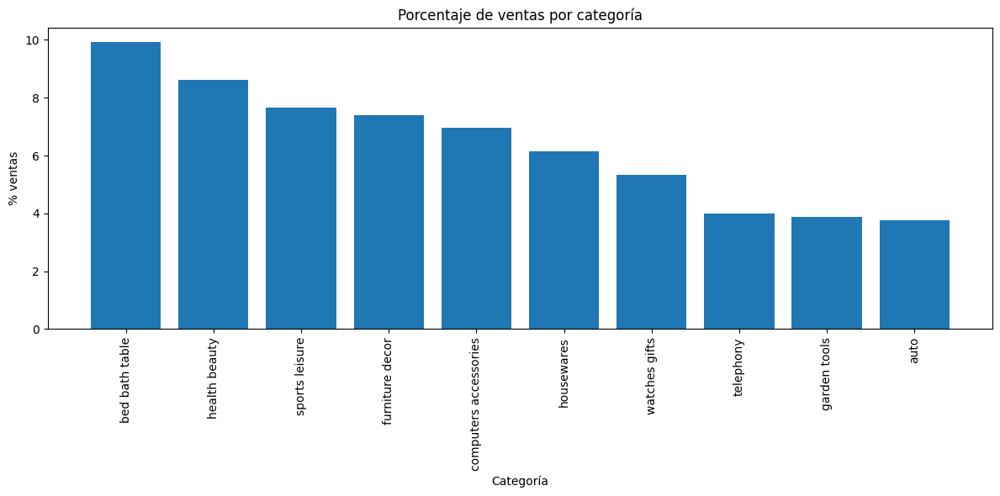

In [58]:
#graficos
#%de ventas por categoría 
df_sorted = df_metric_products.groupby(['product_category_name_english'])['sell_percentage_%'].sum().reset_index().sort_values('sell_percentage_%', ascending=False).head(10)

plt.figure(figsize=(12,6))
plt.bar(df_sorted['product_category_name_english'], df_sorted['sell_percentage_%'])
plt.xticks(rotation=90)
plt.title("Porcentaje de ventas por categoría")
plt.ylabel("% ventas")
plt.xlabel("Categoría")
plt.tight_layout()
plt.show()


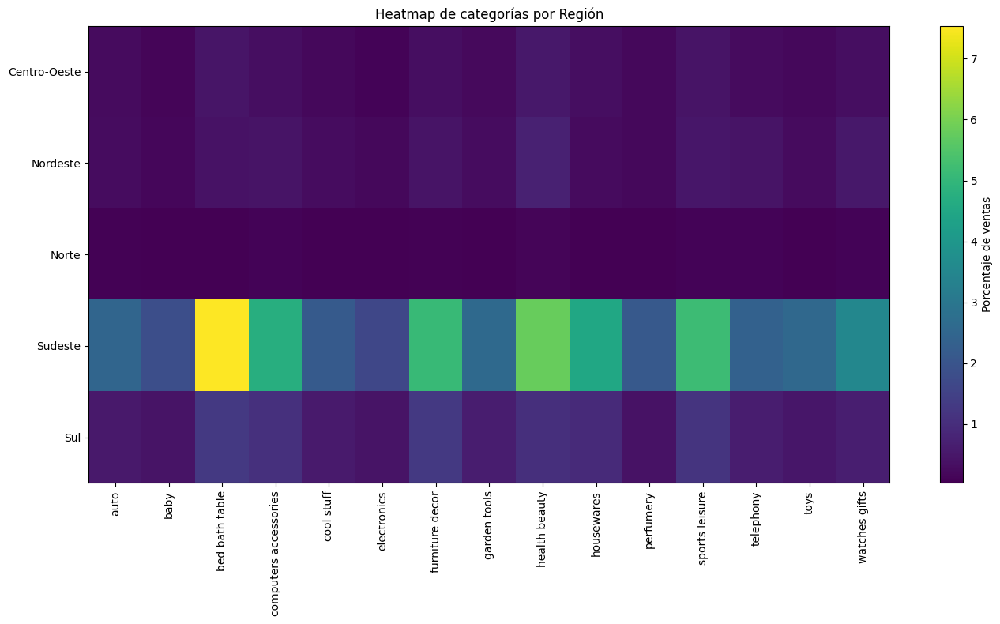

In [59]:
#mapa calor top 15 categorias ciudades por estado
top_n = 15

top_categories = (df_metric_products.groupby('product_category_name_english')['sell_percentage_%'].sum().nlargest(top_n).index)
region_map = {
    "SP": "Sudeste", "RJ": "Sudeste", "MG": "Sudeste", "ES": "Sudeste",
    "RS": "Sul", "SC": "Sul", "PR": "Sul",
    "BA": "Nordeste", "PE": "Nordeste", "CE": "Nordeste", "RN": "Nordeste",
    "AM": "Norte", "PA": "Norte", "RO": "Norte", 
    "DF": "Centro-Oeste", "GO": "Centro-Oeste", "MT": "Centro-Oeste"
}

df_metric_products['region'] = df_metric_products['customer_state'].map(region_map)
df_filtered = df_metric_products[df_metric_products['product_category_name_english'].isin(top_categories)]
df_grouped = (df_filtered.groupby(['region', 'product_category_name_english'])['sell_percentage_%'].sum().reset_index())
pivot = df_grouped.pivot(index='region',columns='product_category_name_english',values='sell_percentage_%')

plt.figure(figsize=(14,8))
plt.imshow(pivot, aspect='auto')
plt.colorbar(label='Porcentaje de ventas')
plt.xticks(range(len(pivot.columns)), pivot.columns, rotation=90)
plt.yticks(range(len(pivot.index)), pivot.index)
plt.title("Heatmap de categorías por Región")
plt.tight_layout()
plt.show()

In [60]:
df_state_sum = (
    df_metric_products.groupby('customer_state')
      .agg(
          total_sells=('number_sells', 'sum'),
          total_customers=('number_customers', 'sum'),
          total_sell_percentage=('sell_percentage_%', 'sum'),
          total_ratio=('ratio_customer_buy', 'sum')
      )
      .reset_index()
)

In [61]:
df_top_category_state = (df_metric_products.loc[df_metric_products.groupby('customer_state')['number_sells'].idxmax(),['customer_state', 'product_category_name_english']])

In [62]:
df_final_metrics = df_state_sum.merge(df_top_category_state, on='customer_state')
df_final_metrics['total_ratio'] = (df_final_metrics['total_sells']/df_final_metrics['total_customers']).round(2)
df_final_metrics

,customer_state,total_sells,total_customers,total_sell_percentage,total_ratio,product_category_name_english
0,AC,91,78,0.04,1.17,furniture decor
1,AL,427,376,0.36,1.14,health beauty
2,AM,163,147,0.10,1.11,health beauty
3,AP,81,75,0.06,1.08,health beauty
4,BA,3682,3260,3.32,1.13,health beauty
5,CE,1426,1277,1.26,1.12,health beauty
6,DF,2355,2123,2.11,1.11,health beauty
7,ES,2225,1997,1.99,1.11,bed bath table
8,GO,2277,2039,2.06,1.12,bed bath table
9,MA,800,716,0.69,1.12,health beauty


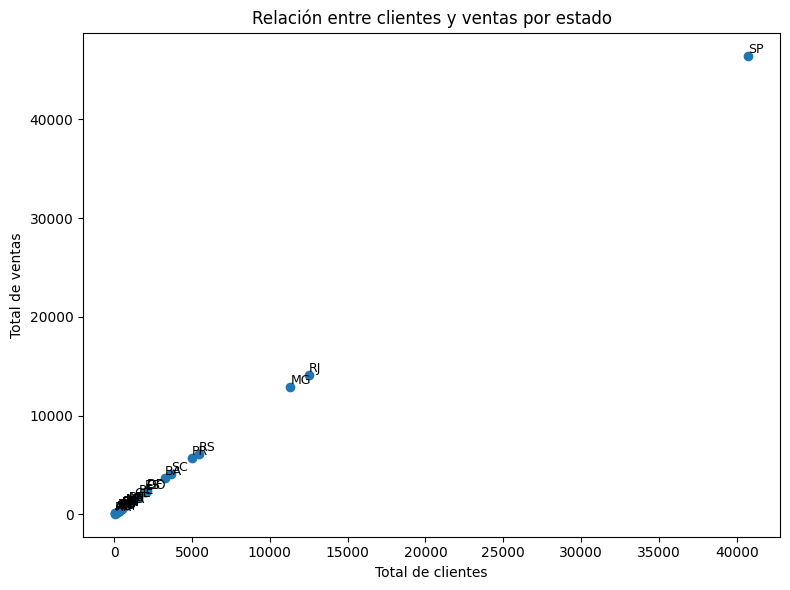

In [63]:
#Número de clientes vs ventas totales
plt.figure(figsize=(8,6))
plt.scatter(df_final_metrics['total_customers'], df_final_metrics['total_sells'])

for i in range(len(df_final_metrics)):
    plt.text(df_final_metrics['total_customers'][i], df_final_metrics['total_sells'][i], df_final_metrics['customer_state'][i],
             fontsize=9, ha='left', va='bottom')
    
plt.title("Relación entre clientes y ventas por estado")
plt.xlabel("Total de clientes")
plt.ylabel("Total de ventas")
plt.tight_layout()
plt.show()

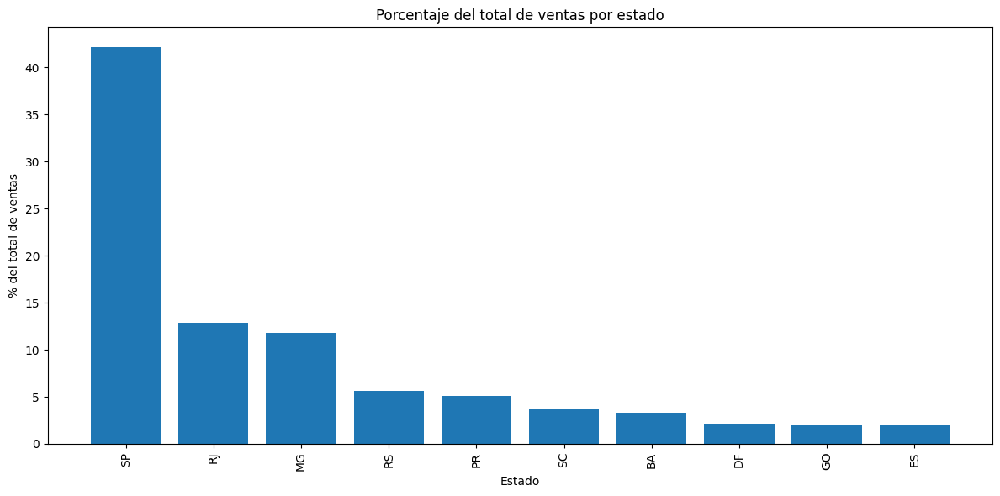

In [64]:
#% total de ventas por estado
df_sorted = df_final_metrics.sort_values('total_sell_percentage', ascending=False).head(10)

plt.figure(figsize=(12,6))
plt.bar(df_sorted['customer_state'], df_sorted['total_sell_percentage'])
plt.xticks(rotation=90)
plt.title("Porcentaje del total de ventas por estado")
plt.ylabel("% del total de ventas")
plt.xlabel("Estado")
plt.tight_layout()
plt.show()

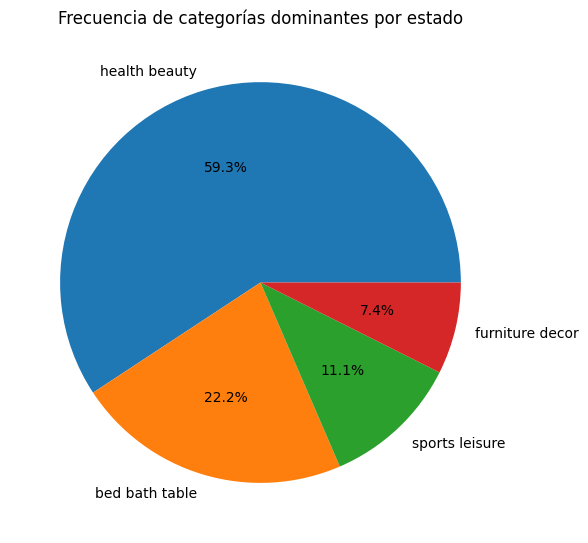

In [65]:
#frecuencia categorias dominantes por estado
counts = df_final_metrics['product_category_name_english'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(counts, labels=counts.index, autopct='%1.1f%%')
plt.title("Frecuencia de categorías dominantes por estado")
plt.tight_layout()
plt.show()

In [66]:
# importar GeoDataFrame Brasil 
gdf = gpd.read_file('resources/brazil_geo.json')
gdf = gdf.sort_values('id').reset_index(drop=True)
gdf

,id,name,geometry
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350..."
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.8618, -35.90153 -..."
2,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.619 -..."
3,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0..."
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708..."
5,CE,Ceará,"MULTIPOLYGON (((-38.47542 -3.70097, -38.47542 ..."
6,DF,Distrito Federal,"POLYGON ((-48.03603 -15.50022, -47.772 -15.500..."
7,ES,Espírito Santo,"MULTIPOLYGON (((-40.88403 -21.16125, -40.88403..."
8,GO,Goiás,"POLYGON ((-50.15817 -12.41238, -50.15942 -12.4..."
9,MA,Maranhão,"MULTIPOLYGON (((-42.12375 -2.80069, -42.12375 ..."


In [67]:
# añadir datos de pedido a los datos de geolocalizacion
df_state_group.sort_values(by='customer_state').reset_index(drop=True)
gdf_order = gdf.copy()
gdf_order['order_number'] = df_state_group.sort_values(by='customer_state')['customer_unique_id'].reset_index(drop=True)
gdf_order

,id,name,geometry,order_number
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350...",77
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.8618, -35.90153 -...",403
2,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.619 -...",144
3,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0...",67
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708...",3281
5,CE,Ceará,"MULTIPOLYGON (((-38.47542 -3.70097, -38.47542 ...",1314
6,DF,Distrito Federal,"POLYGON ((-48.03603 -15.50022, -47.772 -15.500...",2079
7,ES,Espírito Santo,"MULTIPOLYGON (((-40.88403 -21.16125, -40.88403...",1971
8,GO,Goiás,"POLYGON ((-50.15817 -12.41238, -50.15942 -12.4...",1955
9,MA,Maranhão,"MULTIPOLYGON (((-42.12375 -2.80069, -42.12375 ...",727


C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\1068746118.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_order['centroid'] = gdf_order.centroid
C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\1068746118.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(gdf_order.centroid.x, gdf_order.centroid.y, gdf_order.name):


<Axes: title={'center': 'Ventas por Estado'}>

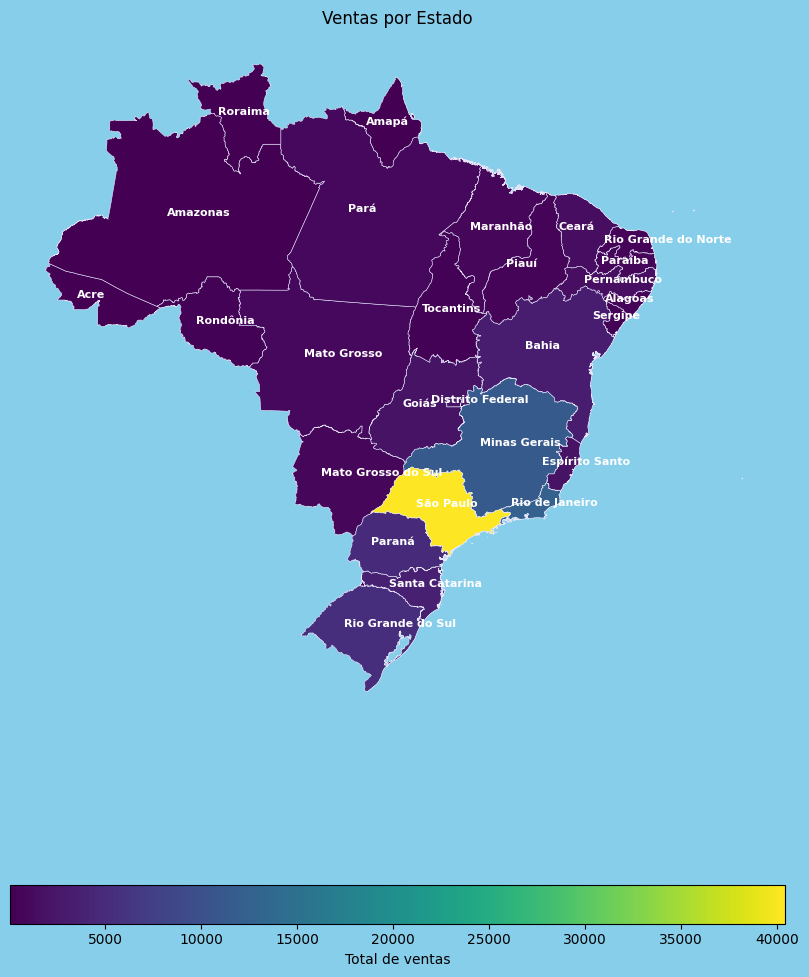

In [ ]:
# pintar mapa coropletico
gdf_order['centroid'] = gdf_order.centroid
fig,ax = plt.subplots(figsize=(10,14))
fig.patch.set_facecolor('skyblue')
ax.set_axis_off()
ax.set_title('Ventas por Estado')
for x, y, label in zip(gdf_order.centroid.x, gdf_order.centroid.y, gdf_order.name):
    ax.annotate(label, xy=(x-1.5, y), xytext=(0, 0), textcoords="offset points", size=8, color='white', weight='bold')

gdf_order.plot('order_number',
        # cmap='viridian',
        legend=True, 
        legend_kwds={"label": "Total de ventas", "orientation": "horizontal"},
        edgecolor='lavender',
        linewidth=0.4,
        ax=ax)

In [69]:
# agrupacion de pedidos retrasados por estado
df_late_state = df_merge_late_total.groupby(['customer_state']).agg({'orders_late':'sum',
                                                                     'late_orders_respect_total_%':'mean',
                                                                     'delay_days':'mean'}).reset_index()
df_late_state

,customer_state,orders_late,late_orders_respect_total_%,delay_days
0,AC,3,7.500000,19.034460
1,AL,95,9.550000,7.572470
2,AM,6,7.180000,13.319678
3,AP,3,9.576667,48.862674
4,BA,467,9.595798,12.089344
5,CE,198,9.720943,13.598759
6,DF,147,10.180000,6.638818
7,ES,247,9.373125,16.811626
8,GO,162,8.992917,11.279692
9,MA,151,9.735814,14.130621


In [70]:
# renombrar columnas
df_late_state = df_late_state.rename(columns={'customer_state':'id','late_orders_respect_total_%':'orders_late_percent'})
df_late_state

,id,orders_late,orders_late_percent,delay_days
0,AC,3,7.500000,19.034460
1,AL,95,9.550000,7.572470
2,AM,6,7.180000,13.319678
3,AP,3,9.576667,48.862674
4,BA,467,9.595798,12.089344
5,CE,198,9.720943,13.598759
6,DF,147,10.180000,6.638818
7,ES,247,9.373125,16.811626
8,GO,162,8.992917,11.279692
9,MA,151,9.735814,14.130621


In [71]:
# juntar datos de geolocalizacion con pedidos retrasados
gdf_late = pd.merge(
    gdf,
    df_late_state,
    on='id',
    how='inner'
)
gdf_late

,id,name,geometry,orders_late,orders_late_percent,delay_days
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350...",3,7.500000,19.034460
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.8618, -35.90153 -...",95,9.550000,7.572470
2,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.619 -...",6,7.180000,13.319678
3,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0...",3,9.576667,48.862674
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708...",467,9.595798,12.089344
5,CE,Ceará,"MULTIPOLYGON (((-38.47542 -3.70097, -38.47542 ...",198,9.720943,13.598759
6,DF,Distrito Federal,"POLYGON ((-48.03603 -15.50022, -47.772 -15.500...",147,10.180000,6.638818
7,ES,Espírito Santo,"MULTIPOLYGON (((-40.88403 -21.16125, -40.88403...",247,9.373125,16.811626
8,GO,Goiás,"POLYGON ((-50.15817 -12.41238, -50.15942 -12.4...",162,8.992917,11.279692
9,MA,Maranhão,"MULTIPOLYGON (((-42.12375 -2.80069, -42.12375 ...",151,9.735814,14.130621


C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\2185352885.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_late['centroid'] = gdf_late.centroid
C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\2185352885.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(gdf_late.centroid.x, gdf_late.centroid.y, gdf_late.orders_late_percent.round(2)):


<Axes: title={'center': 'Porcentaje de pedidos retrasados'}>

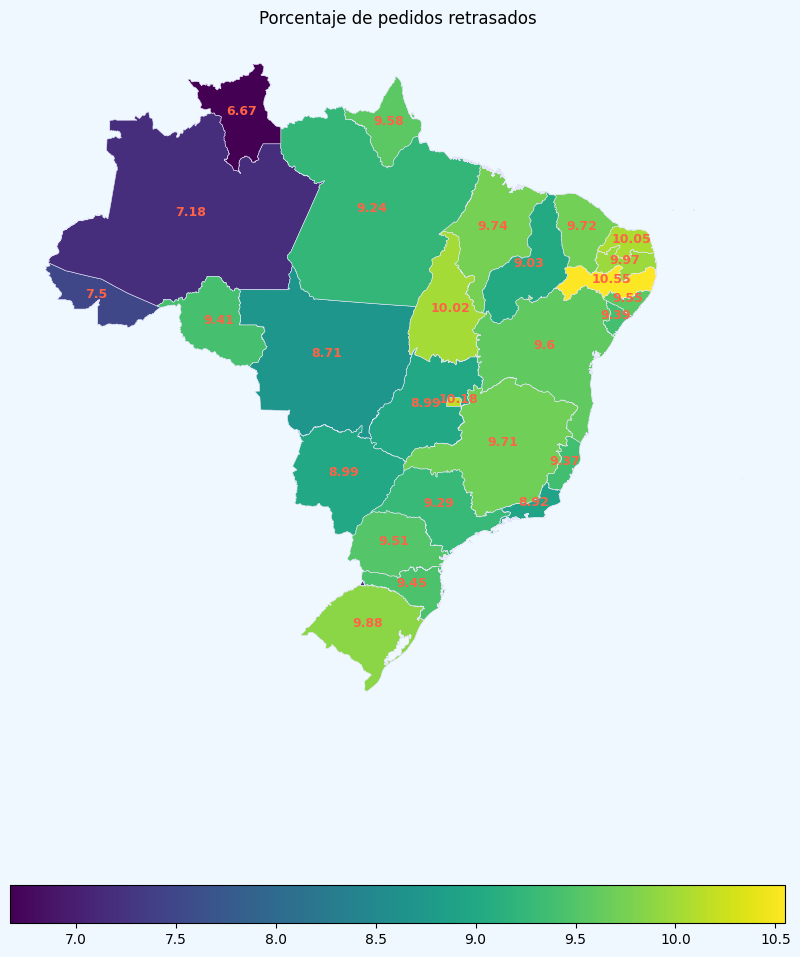

In [72]:
# pintar mapa estatico
gdf_late['centroid'] = gdf_late.centroid
fig,ax = plt.subplots(figsize=(10,14))
fig.patch.set_facecolor('aliceblue')
ax.set_axis_off()
ax.set_title('Porcentaje de pedidos retrasados')
for x, y, label in zip(gdf_late.centroid.x, gdf_late.centroid.y, gdf_late.orders_late_percent.round(2)):
    ax.annotate(label, xy=(x-1, y), xytext=(0, 0), textcoords="offset points", size=9, color='tomato', weight='bold')

gdf_late.plot('orders_late_percent',
        legend=True, 
        legend_kwds={"orientation": "horizontal",},
        edgecolor='lavender',
        linewidth=0.4,
        ax=ax)

In [73]:
# pintar mapa dinamico
gdf_late.explore('orders_late_percent')

In [74]:
# buscar pedidos que han sido entregados
df_orders_delivered = df_orders[df_orders['order_status']=='Delivered']
df_orders_delivered

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_diference
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7 days 02:34:47
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,5 days 08:32:15
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,17 days 05:53:31
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,12 days 23:31:18
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,9 days 05:42:58
...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,10 days 08:51:59
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1 days 06:22:04
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,5 days 12:35:43
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,20 days 00:27:06


In [75]:
# calcular cuanto tardaron en entregarse
df_orders_delivered['dilvery_time'] = df_orders_delivered['order_delivered_customer_date'] - df_orders_delivered['order_purchase_timestamp']
df_orders_delivered

C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\541370621.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_orders_delivered['dilvery_time'] = df_orders_delivered['order_delivered_customer_date'] - df_orders_delivered['order_purchase_timestamp']


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_diference,dilvery_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,Delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7 days 02:34:47,8 days 10:28:40
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,Delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,5 days 08:32:15,13 days 18:46:08
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,Delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,17 days 05:53:31,9 days 09:27:40
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,Delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,12 days 23:31:18,13 days 05:00:36
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,Delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,9 days 05:42:58,2 days 20:58:23
...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,Delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,10 days 08:51:59,8 days 05:13:56
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,Delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,1 days 06:22:04,22 days 04:38:58
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,Delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,5 days 12:35:43,24 days 20:37:34
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,Delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,20 days 00:27:06,17 days 02:04:27


In [76]:
# añadir a que estado pertenecen esos pedidos
df_delivery_time = pd.merge(
    df_customers[['customer_id','customer_state']],
    df_orders_delivered[['customer_id','dilvery_time']],
    on='customer_id',
    how='left'
)
df_delivery_time

,customer_id,customer_state,dilvery_time
0,06b8999e2fba1a1fbc88172c00ba8bc7,SP,8 days 19:30:00
1,18955e83d337fd6b2def6b18a428ac77,SP,16 days 15:52:55
2,4e7b3e00288586ebd08712fdd0374a03,SP,26 days 01:51:06
3,b2b6027bc5c5109e529d4dc6358b12c3,SP,14 days 23:57:47
4,4f2d8ab171c80ec8364f7c12e35b23ad,SP,11 days 11:04:18
...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,SP,6 days 04:18:20
99437,e7b71a9017aa05c9a7fd292d714858e8,SP,7 days 10:34:23
99438,5e28dfe12db7fb50a4b2f691faecea5e,CE,30 days 22:51:25
99439,56b18e2166679b8a959d72dd06da27f9,RS,12 days 22:50:06


In [77]:
# agrupar por estado
df_delivery_time_state = df_delivery_time.drop('customer_id', axis=1).groupby('customer_state').mean().reset_index()
df_delivery_time_state

,customer_state,dilvery_time
0,AC,21 days 00:51:25.600000
1,AL,24 days 13:03:09.103274559
2,AM,26 days 10:13:25.613793103
3,AP,27 days 04:26:29.850746268
4,BA,19 days 08:03:04.247235872
5,CE,21 days 06:23:52.394057857
6,DF,12 days 23:13:17.884615384
7,ES,15 days 18:56:36.134335839
8,GO,15 days 14:33:07.649463464
9,MA,21 days 13:45:05.167364016


In [78]:
df_delivery_time_state = df_delivery_time_state.rename(columns={'customer_state':'id'})
df_delivery_time_state

,id,dilvery_time
0,AC,21 days 00:51:25.600000
1,AL,24 days 13:03:09.103274559
2,AM,26 days 10:13:25.613793103
3,AP,27 days 04:26:29.850746268
4,BA,19 days 08:03:04.247235872
5,CE,21 days 06:23:52.394057857
6,DF,12 days 23:13:17.884615384
7,ES,15 days 18:56:36.134335839
8,GO,15 days 14:33:07.649463464
9,MA,21 days 13:45:05.167364016


In [79]:
# juntar datos de geolocalizacion con datos de entrega
gdf_delivery = pd.merge(
    gdf,
    df_delivery_time_state,
    on='id',
    how='inner'
)
gdf_delivery

,id,name,geometry,dilvery_time
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350...",21 days 00:51:25.600000
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.8618, -35.90153 -...",24 days 13:03:09.103274559
2,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.619 -...",26 days 10:13:25.613793103
3,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0...",27 days 04:26:29.850746268
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708...",19 days 08:03:04.247235872
5,CE,Ceará,"MULTIPOLYGON (((-38.47542 -3.70097, -38.47542 ...",21 days 06:23:52.394057857
6,DF,Distrito Federal,"POLYGON ((-48.03603 -15.50022, -47.772 -15.500...",12 days 23:13:17.884615384
7,ES,Espírito Santo,"MULTIPOLYGON (((-40.88403 -21.16125, -40.88403...",15 days 18:56:36.134335839
8,GO,Goiás,"POLYGON ((-50.15817 -12.41238, -50.15942 -12.4...",15 days 14:33:07.649463464
9,MA,Maranhão,"MULTIPOLYGON (((-42.12375 -2.80069, -42.12375 ...",21 days 13:45:05.167364016


In [80]:
# pasar de date a float para realizar calculos
gdf_delivery['dilvery_time'] = gdf_delivery['dilvery_time'].dt.total_seconds() / 86400
gdf_delivery

,id,name,geometry,dilvery_time
0,AC,Acre,"POLYGON ((-73.33251 -7.32488, -73.27482 -7.350...",21.035713
1,AL,Alagoas,"MULTIPOLYGON (((-35.90153 -9.8618, -35.90153 -...",24.543855
2,AM,Amazonas,"MULTIPOLYGON (((-53.62548 -26.88481, -53.619 -...",26.425991
3,AP,Amapá,"MULTIPOLYGON (((-50.02403 0.85986, -50.02403 0...",27.185068
4,BA,Bahia,"MULTIPOLYGON (((-38.69708 -17.97903, -38.69708...",19.335466
5,CE,Ceará,"MULTIPOLYGON (((-38.47542 -3.70097, -38.47542 ...",21.266579
6,DF,Distrito Federal,"POLYGON ((-48.03603 -15.50022, -47.772 -15.500...",12.967568
7,ES,Espírito Santo,"MULTIPOLYGON (((-40.88403 -21.16125, -40.88403...",15.789307
8,GO,Goiás,"POLYGON ((-50.15817 -12.41238, -50.15942 -12.4...",15.606339
9,MA,Maranhão,"MULTIPOLYGON (((-42.12375 -2.80069, -42.12375 ...",21.572976


C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\47278490.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_delivery['centroid'] = gdf_delivery.centroid
C:\Users\rvelasco\AppData\Local\Temp\ipykernel_7000\47278490.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(gdf_delivery.centroid.x, gdf_delivery.centroid.y, gdf_delivery.dilvery_time.round(2)):


<Axes: title={'center': 'Dias que tardan en los llegar pedidos de media'}>

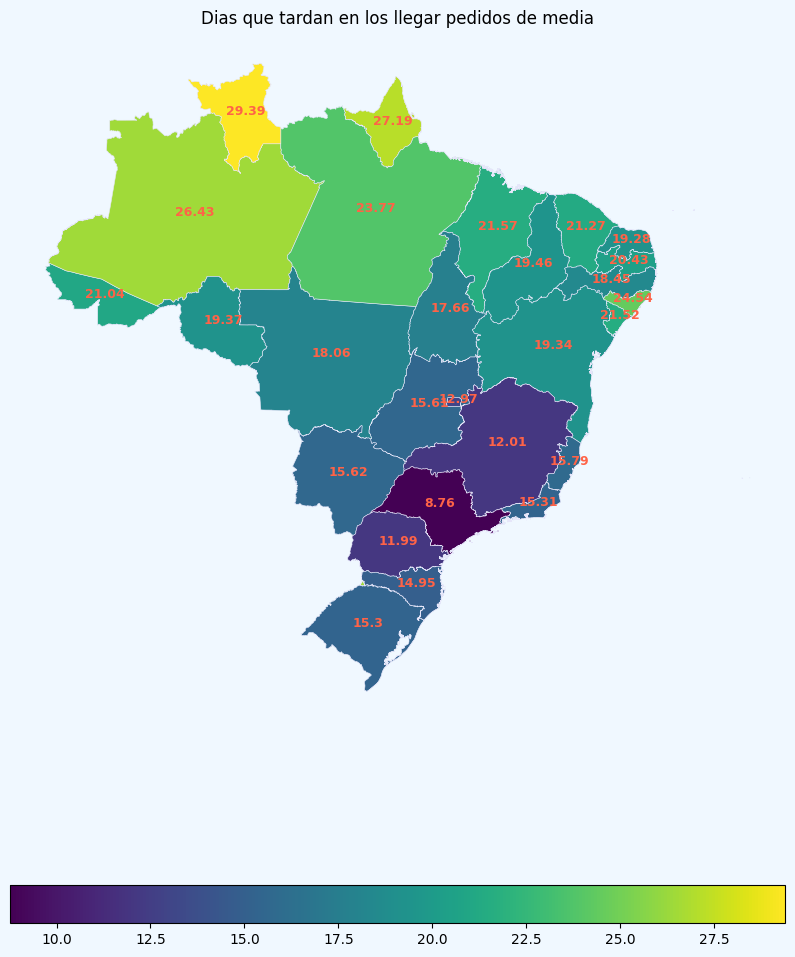

In [81]:
# grafico estatico
gdf_delivery['centroid'] = gdf_delivery.centroid
fig,ax = plt.subplots(figsize=(10,14))
fig.patch.set_facecolor('aliceblue')
ax.set_axis_off()
ax.set_title('Dias que tardan en los llegar pedidos de media')
for x, y, label in zip(gdf_delivery.centroid.x, gdf_delivery.centroid.y, gdf_delivery.dilvery_time.round(2)):
    ax.annotate(label, xy=(x-1, y), xytext=(0, 0), textcoords="offset points", size=9, color='tomato', weight='bold')

gdf_delivery.plot('dilvery_time',
        legend=True, 
        legend_kwds={"orientation": "horizontal",},
        edgecolor='lavender',
        linewidth=0.4,
        ax=ax)